In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [2]:
data=pd.read_csv("surprisehousing.csv")

In [3]:
data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [5]:
data.describe(exclude='object')

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [6]:
data.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

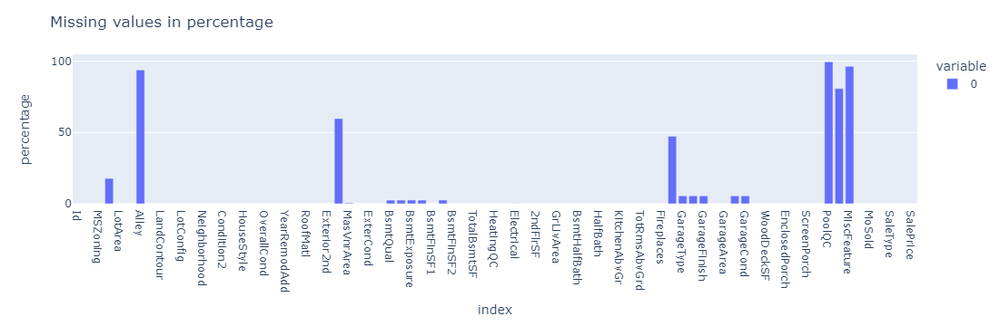

In [7]:
miss_value_per=pd.DataFrame(data.isnull().sum()/len(data)*100)
fig=px.bar(miss_value_per)
fig.update_layout(yaxis_title='percentage',
                 title='Missing values in percentage')
fig.show()

In [8]:
#to apply for all null values in a dataset
def get_parameters(data):
    parameters={}
    for col in data.columns[data.isnull().any()]:
        if data[col].dtype=='float64' or data[col].dtype=='int64' or data[col].dtype=='int32':
            strategy='mean'
        else:
            strategy='most_frequent'
        missing_values=data[col][data[col].isnull()].values[0]
        parameters[col]={'missing_values':missing_values,'strategy':strategy}
    return parameters
get_parameters(data)

{'LotFrontage': {'missing_values': nan, 'strategy': 'mean'},
 'Alley': {'missing_values': nan, 'strategy': 'most_frequent'},
 'MasVnrType': {'missing_values': nan, 'strategy': 'most_frequent'},
 'MasVnrArea': {'missing_values': nan, 'strategy': 'mean'},
 'BsmtQual': {'missing_values': nan, 'strategy': 'most_frequent'},
 'BsmtCond': {'missing_values': nan, 'strategy': 'most_frequent'},
 'BsmtExposure': {'missing_values': nan, 'strategy': 'most_frequent'},
 'BsmtFinType1': {'missing_values': nan, 'strategy': 'most_frequent'},
 'BsmtFinType2': {'missing_values': nan, 'strategy': 'most_frequent'},
 'Electrical': {'missing_values': nan, 'strategy': 'most_frequent'},
 'FireplaceQu': {'missing_values': nan, 'strategy': 'most_frequent'},
 'GarageType': {'missing_values': nan, 'strategy': 'most_frequent'},
 'GarageYrBlt': {'missing_values': nan, 'strategy': 'mean'},
 'GarageFinish': {'missing_values': nan, 'strategy': 'most_frequent'},
 'GarageQual': {'missing_values': nan, 'strategy': 'most_fr

In [9]:
#to store parameters in new variable
parameters=get_parameters(data)

In [10]:
for col, param in parameters.items():
    missing_values = param['missing_values']
    strategy = param['strategy']
    imp = SimpleImputer(missing_values=missing_values, strategy=strategy)

    transformed_col = imp.fit_transform(data[[col]]).reshape(-1)
    data[col] = transformed_col


In [11]:
data.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
Length: 81, dtype: int64

C:\Users\karth\AppData\Local\Temp\ipykernel_13864\3545255702.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='SalePrice', ylabel='Density'>

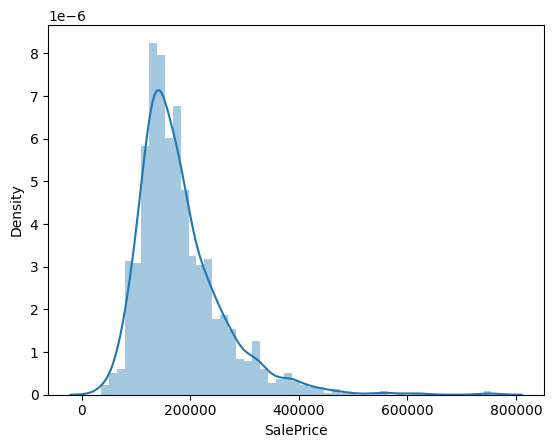

In [12]:
sns.distplot(data['SalePrice'])

In [13]:
print("skewness: ",data['SalePrice'].skew())
print("kurtosis: ",data['SalePrice'].kurt())

skewness:  1.8828757597682129
kurtosis:  6.536281860064529


In [14]:
#the skewness has greater than 1 value so we have to transformation og target variable

In [15]:
data['SalePrice']=np.log(data['SalePrice'])

C:\Users\karth\AppData\Local\Temp\ipykernel_13864\3545255702.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='SalePrice', ylabel='Density'>

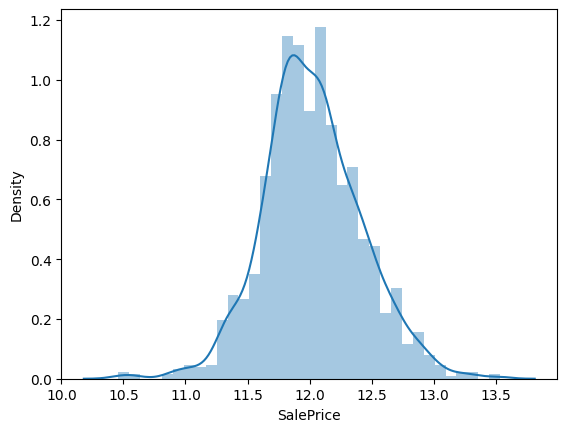

In [16]:
sns.distplot(data['SalePrice'])

In [17]:
print("skewness: ",data['SalePrice'].skew())
print("kurtosis: ",data['SalePrice'].kurt())

skewness:  0.12133506220520406
kurtosis:  0.8095319958036296


In [18]:
data.drop('Id',axis=1,inplace=True)

In [19]:
data[['MSSubClass','OverallQual','OverallCond']]=data[['MSSubClass','OverallQual',
                                                    'OverallCond']].astype('object')


In [20]:
data['LotFrontage']=pd.to_numeric(data['LotFrontage'],errors='coerce')
data['MasVnrArea']=pd.to_numeric(data['MasVnrArea'],errors='coerce')

In [21]:
null_cols=data.columns[data.isnull().any()]
null_cols

Index([], dtype='object')

In [22]:
for i in null_cols:
    if data[i].dtype==np.float64 or data[i].dtype==np.int64:
        data[i].fillna(data[i].mean(),inplace=True)
    else:
        data[i].fillna(data[i].mode()[0],inplace=True)

In [23]:
data.isna().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
                ..
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
Length: 80, dtype: int64

##Univariant Analysis

In [24]:
#categorical columns
cat_columns=data.select_dtypes(include='object').columns
cat_columns

Index(['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu',
       'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive',
       'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition'],
      dtype='object')

In [25]:
#numerical columns
num_cols=data.select_dtypes(['int64','float64']).columns
num_cols

Index(['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath',
       'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

LotFrontage


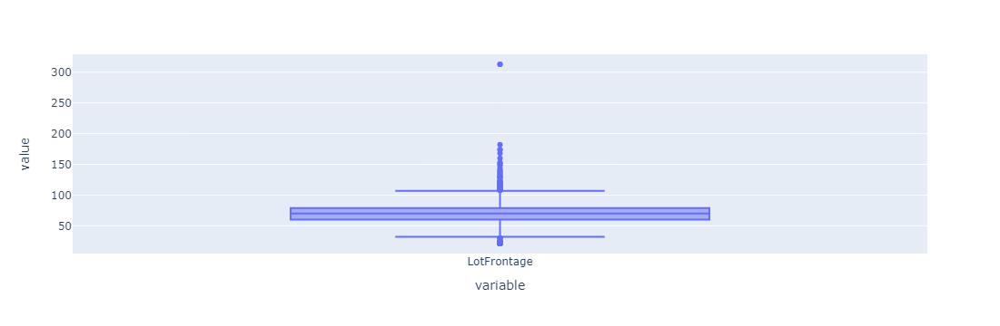

LotArea


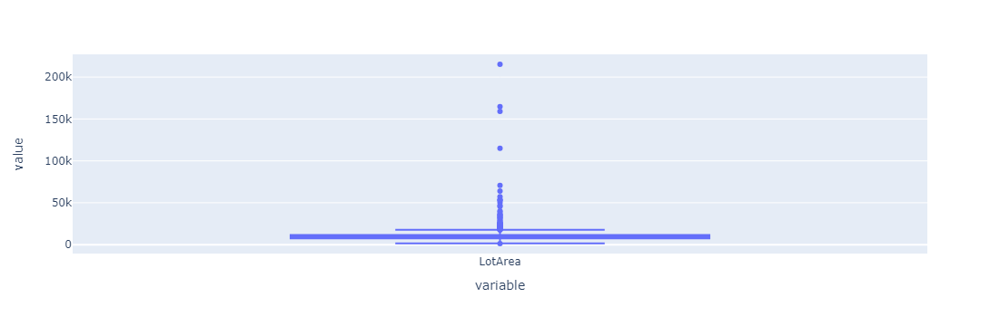

YearBuilt


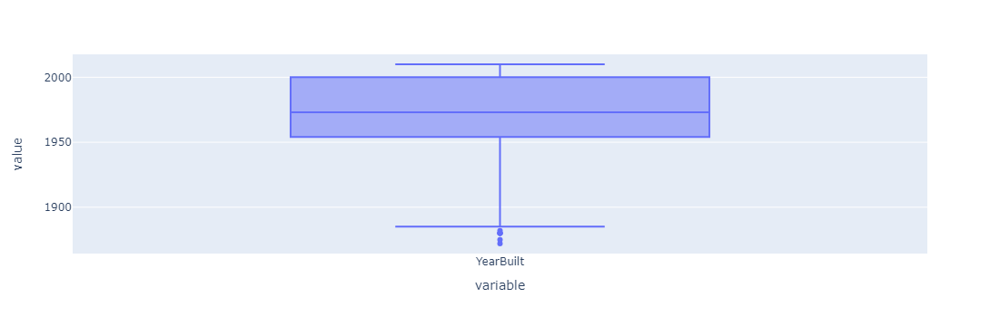

YearRemodAdd


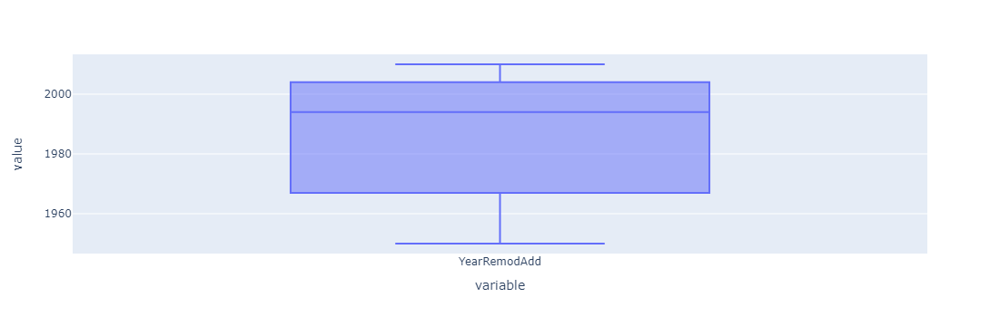

MasVnrArea


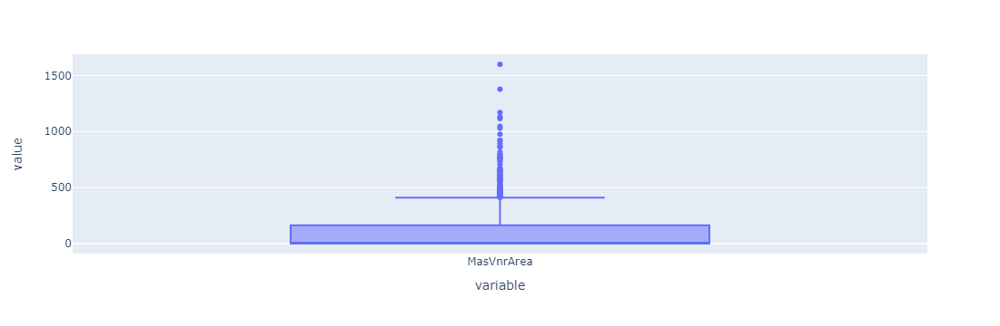

BsmtFinSF1


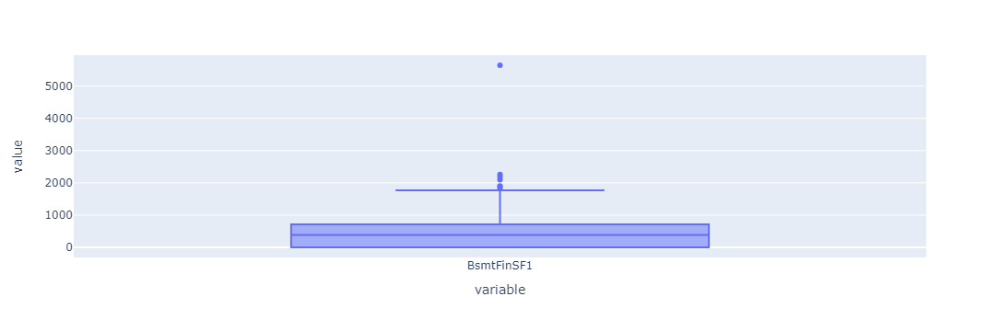

BsmtFinSF2


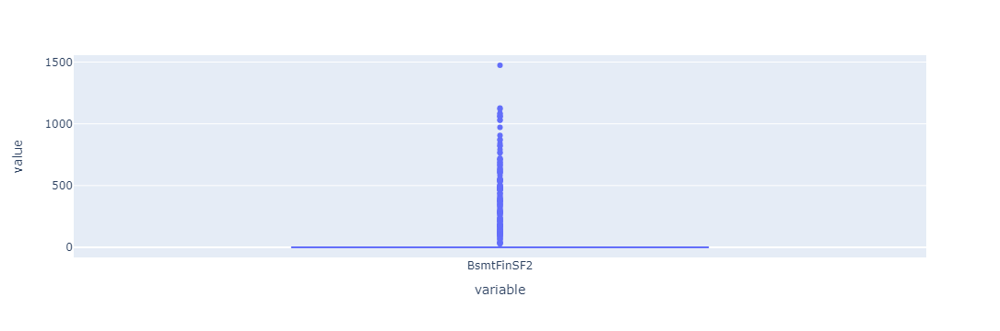

BsmtUnfSF


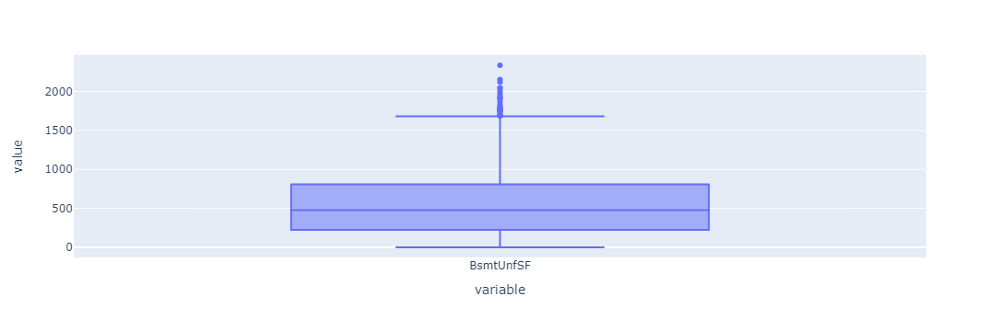

TotalBsmtSF


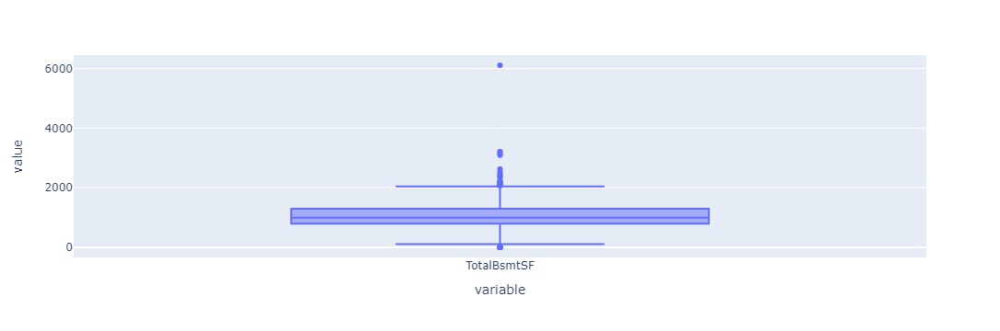

1stFlrSF


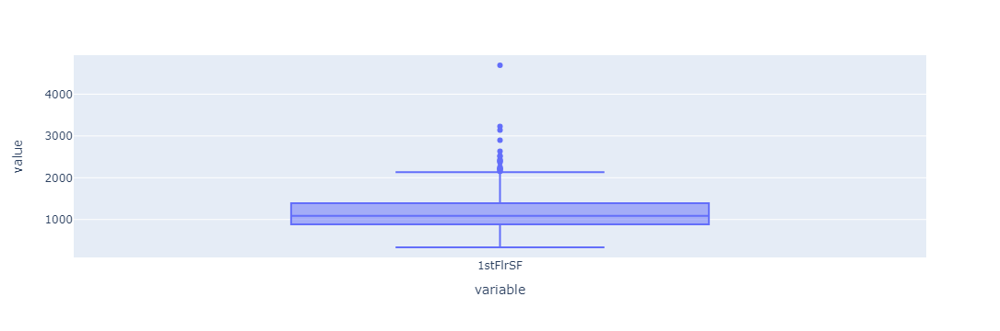

2ndFlrSF


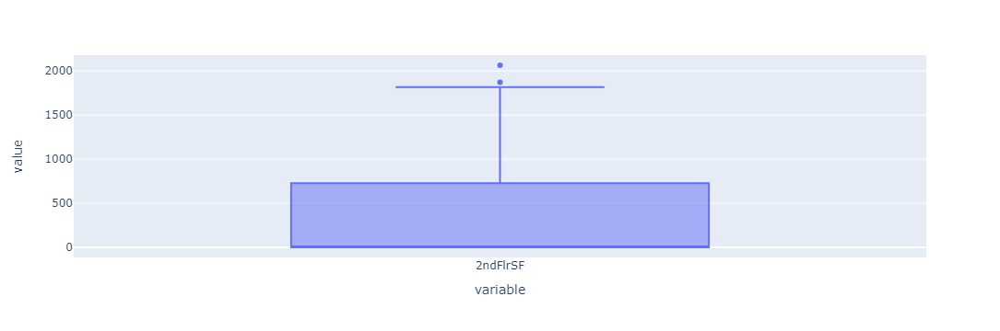

LowQualFinSF


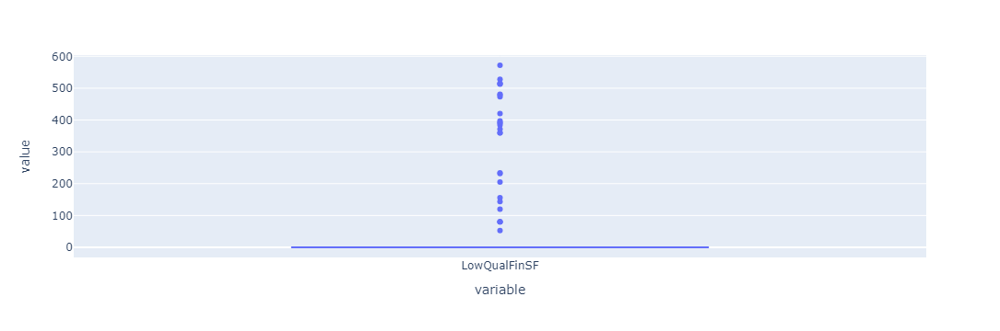

GrLivArea


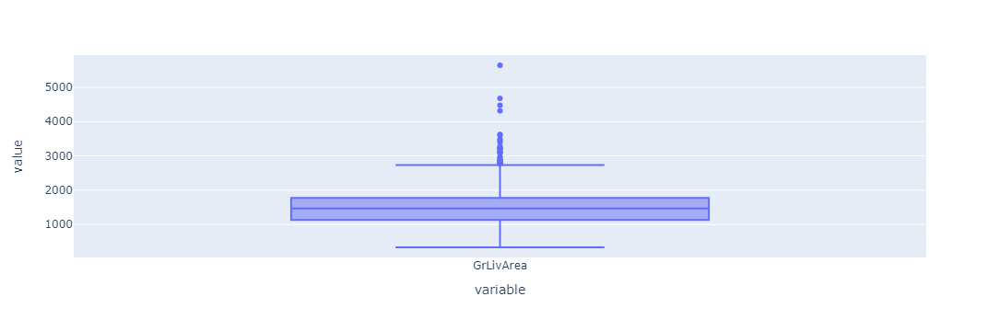

BsmtFullBath


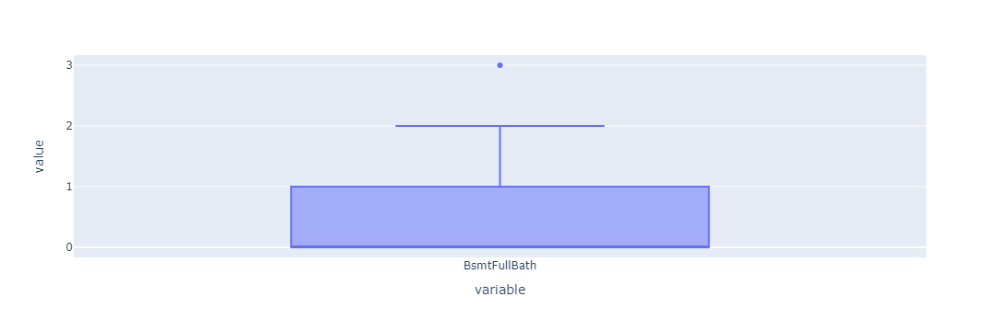

BsmtHalfBath


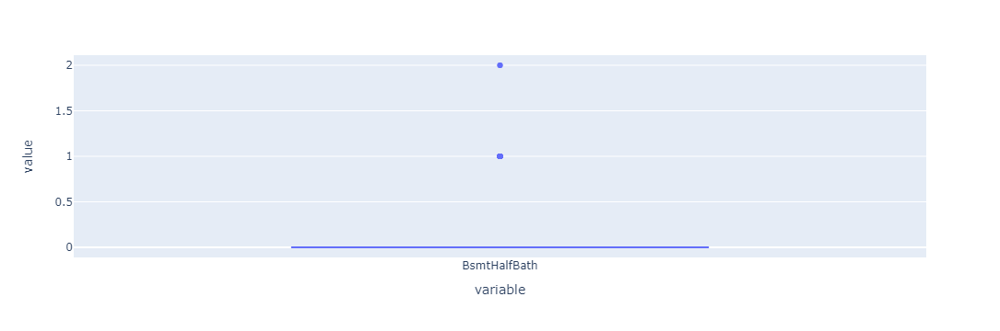

FullBath


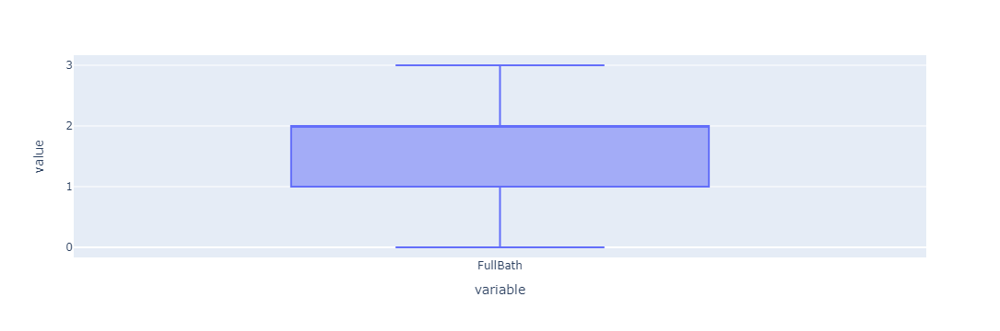

HalfBath


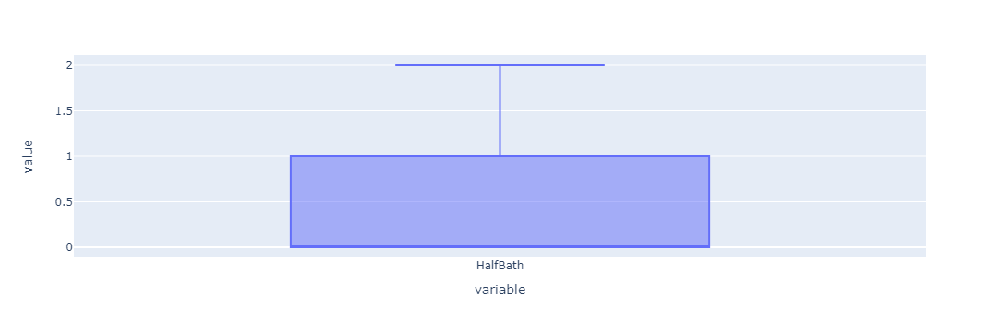

BedroomAbvGr


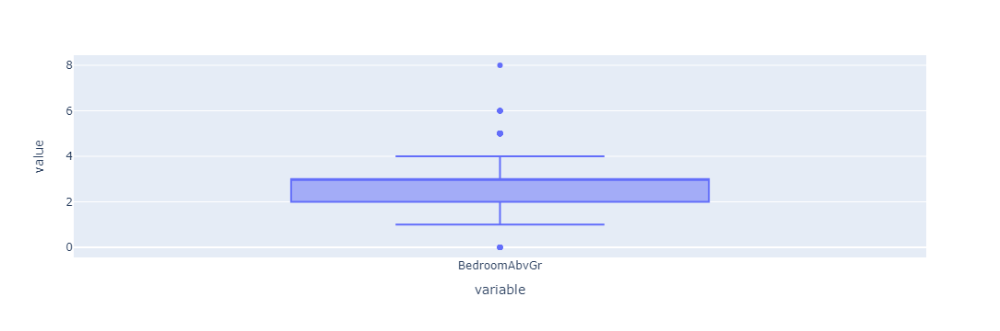

KitchenAbvGr


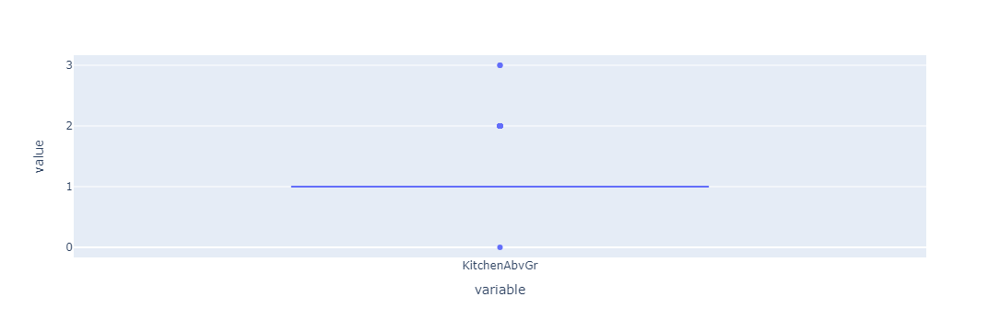

TotRmsAbvGrd


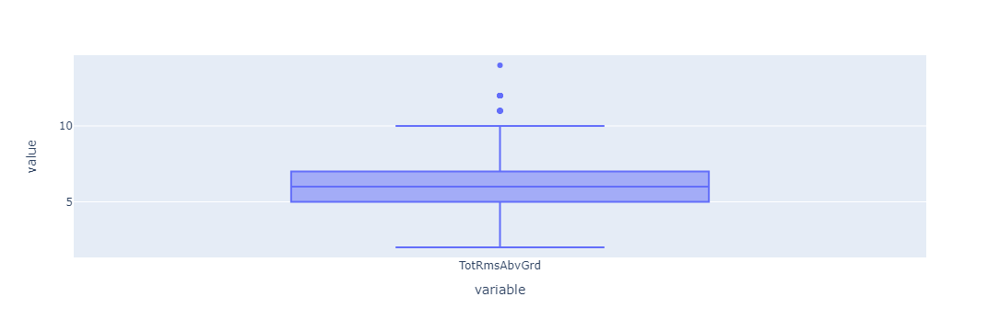

Fireplaces


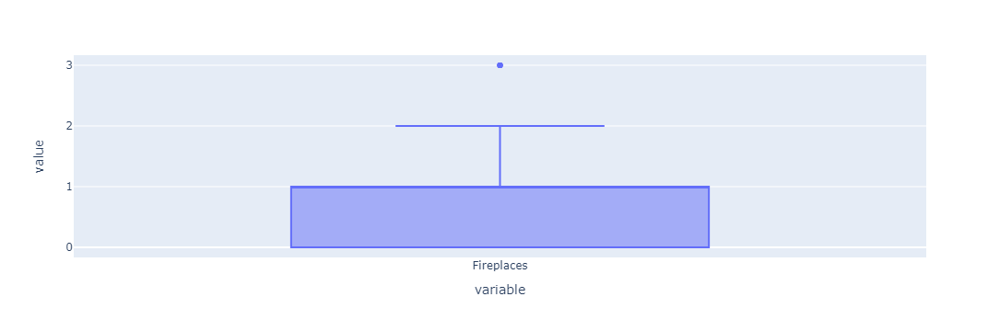

GarageYrBlt


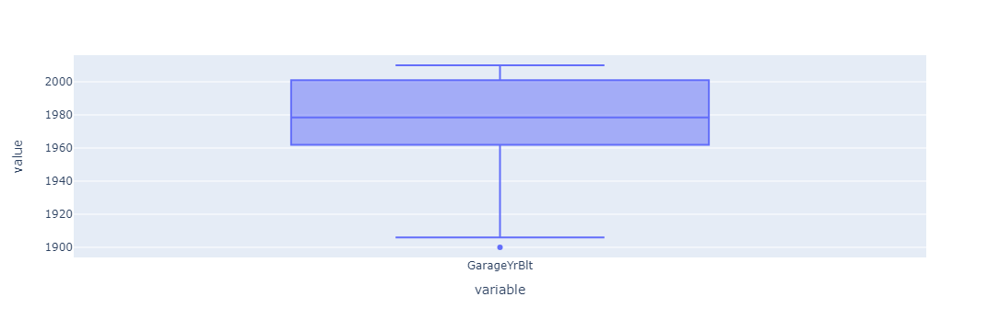

GarageCars


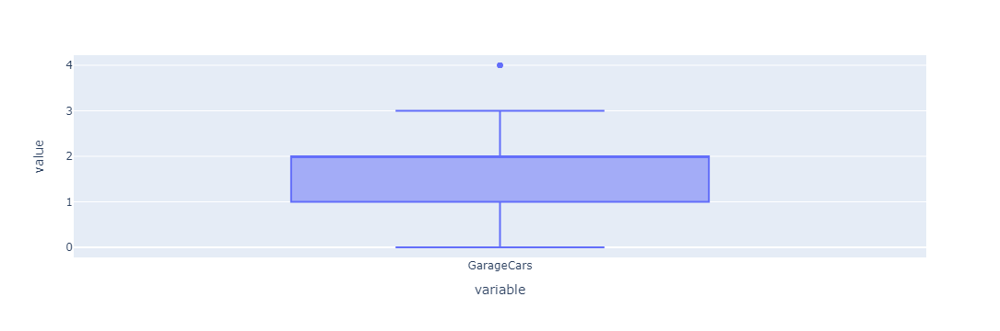

GarageArea


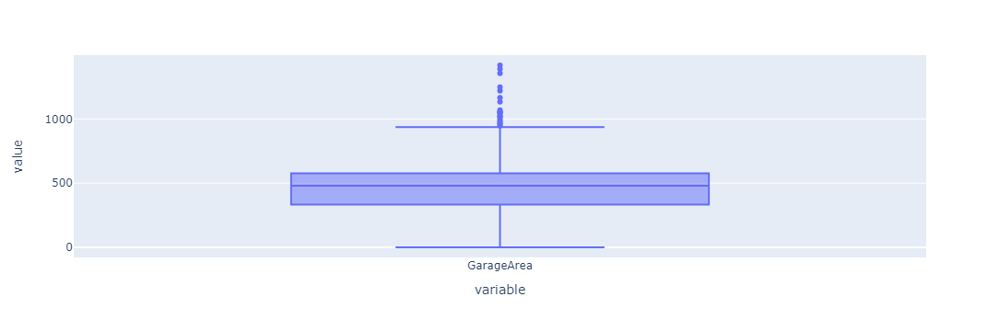

WoodDeckSF


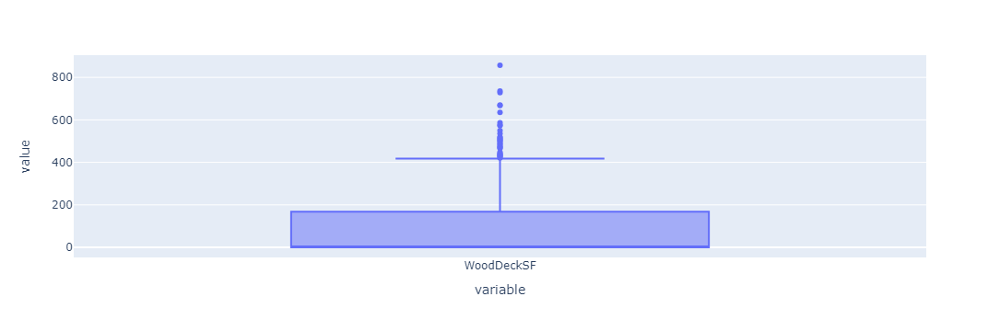

OpenPorchSF


EnclosedPorch


3SsnPorch


ScreenPorch


PoolArea


MiscVal


MoSold


YrSold


SalePrice


In [26]:
#numerical columns
for i in num_cols:
    fig=px.box(data[i])
    print(i)
    fig.show()

MSSubClass


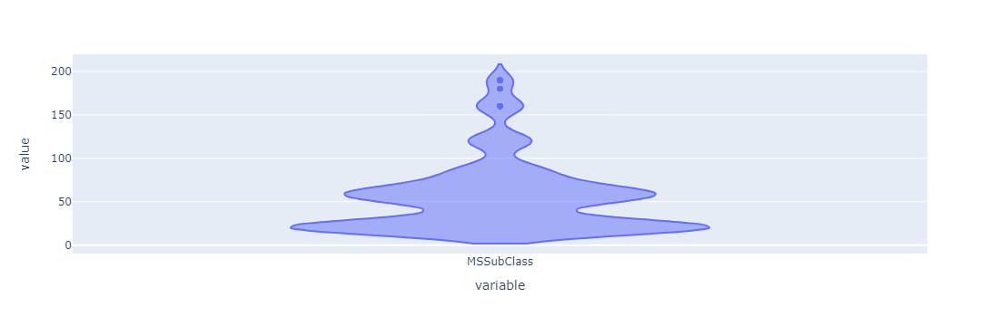

MSZoning


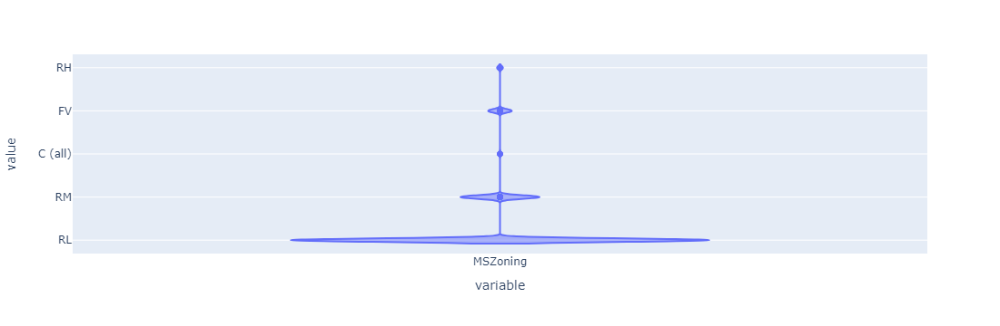

Street


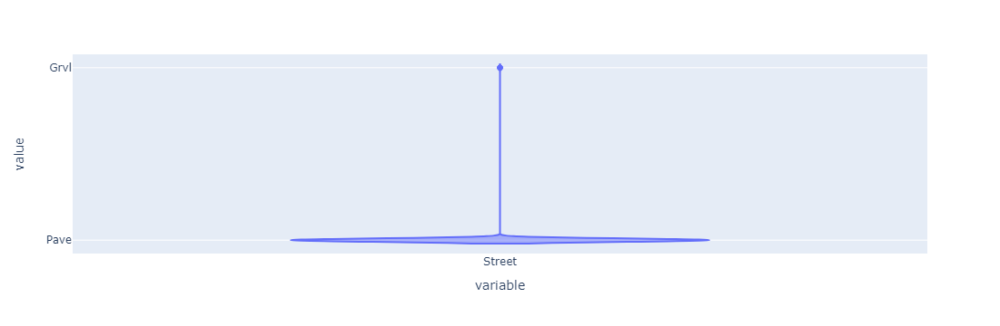

Alley


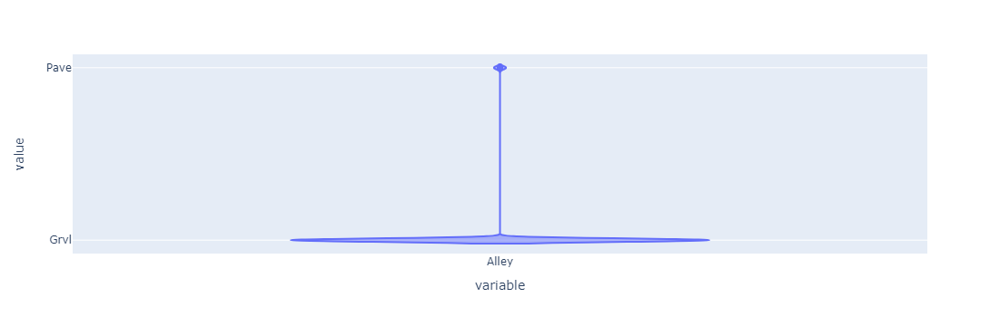

LotShape


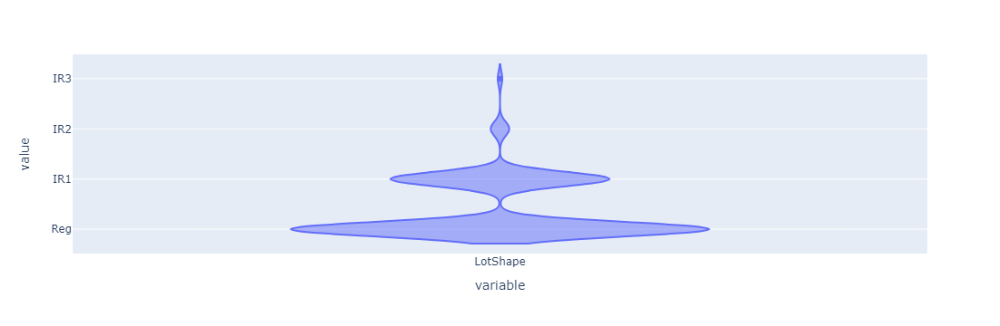

LandContour


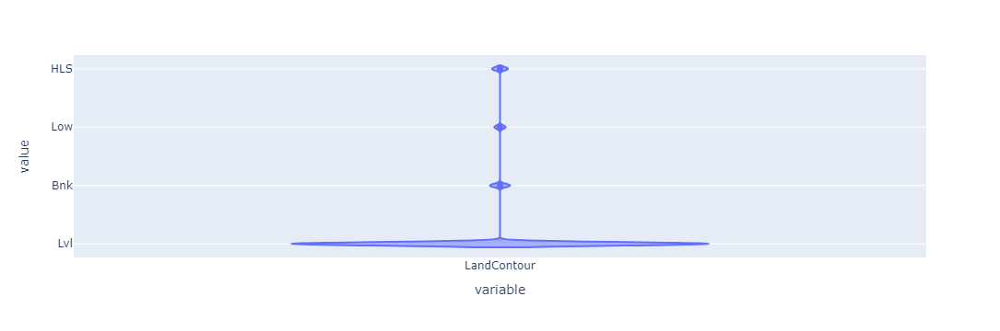

Utilities


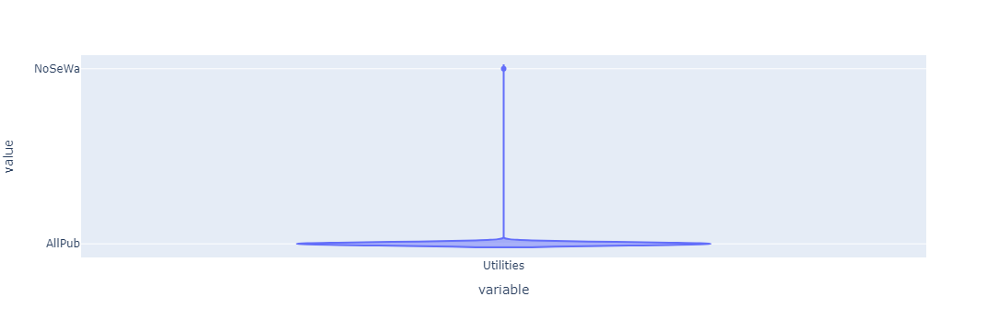

LotConfig


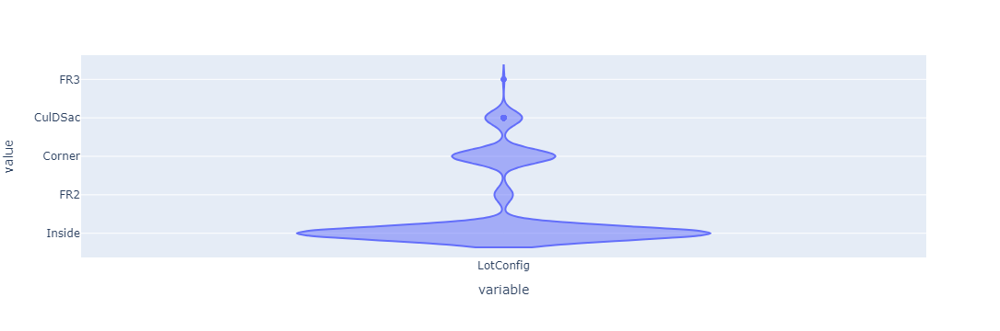

LandSlope


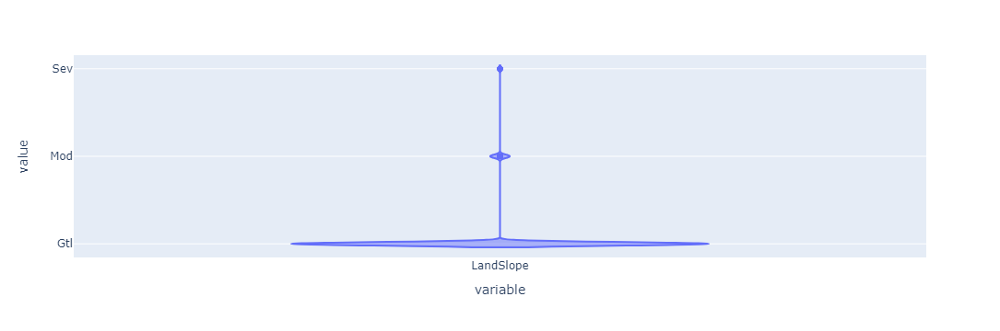

Neighborhood


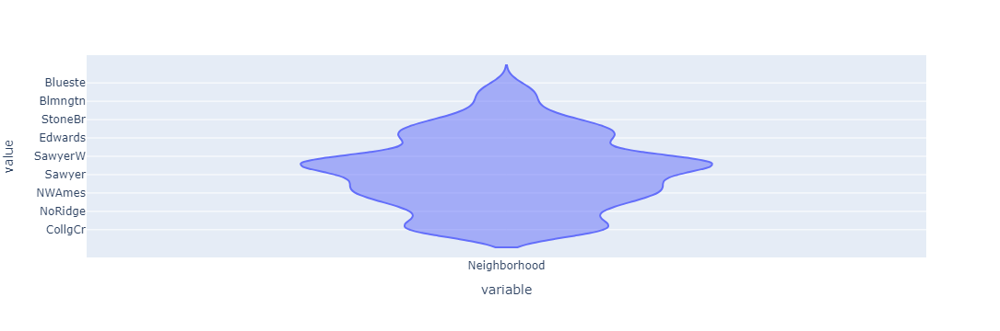

Condition1


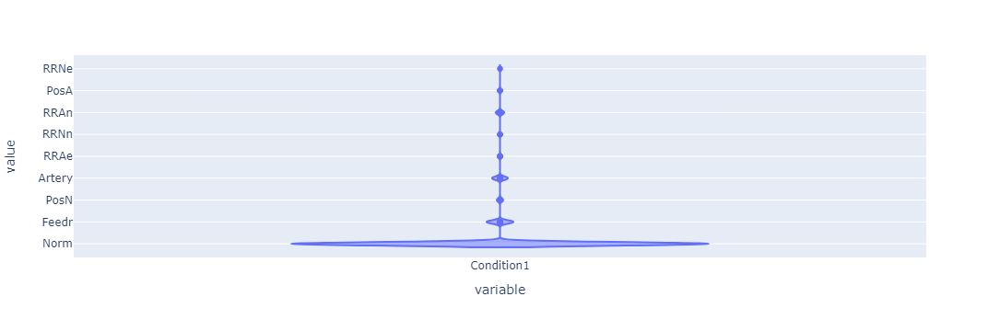

Condition2


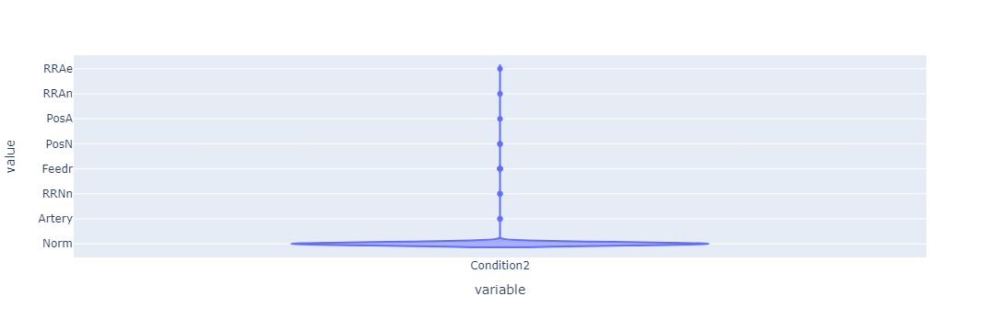

BldgType


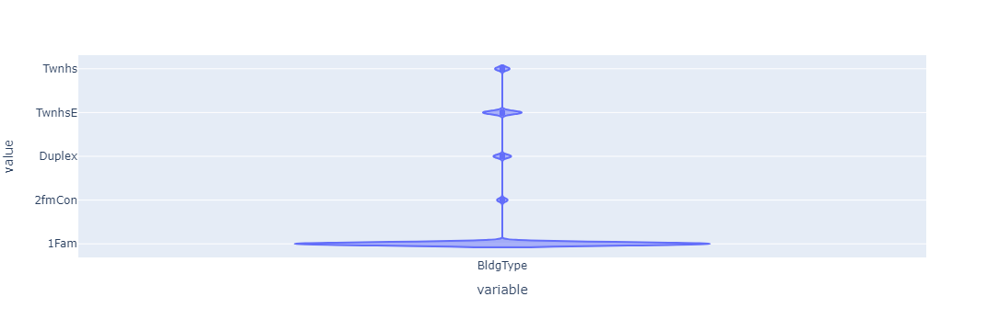

HouseStyle


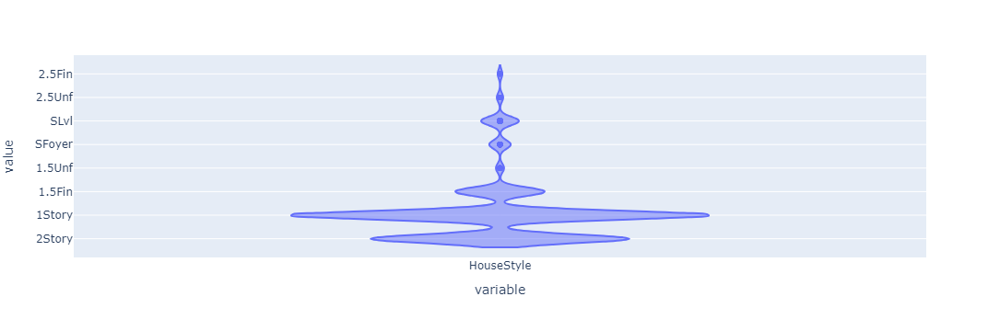

OverallQual


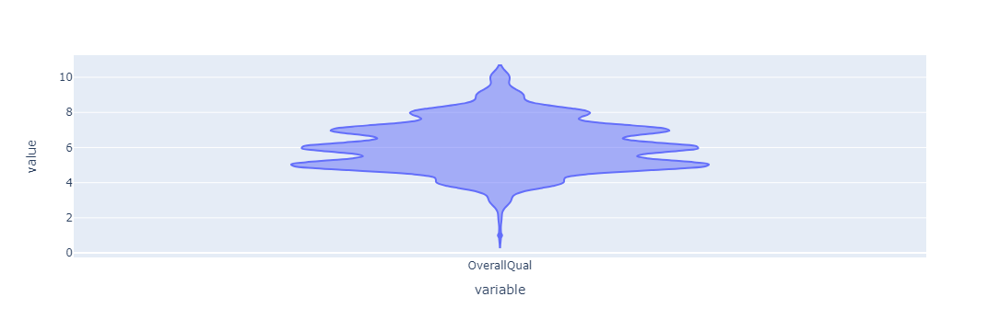

OverallCond


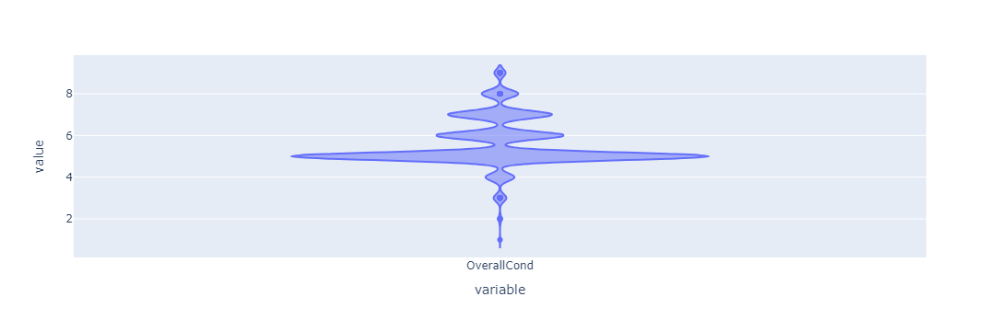

RoofStyle


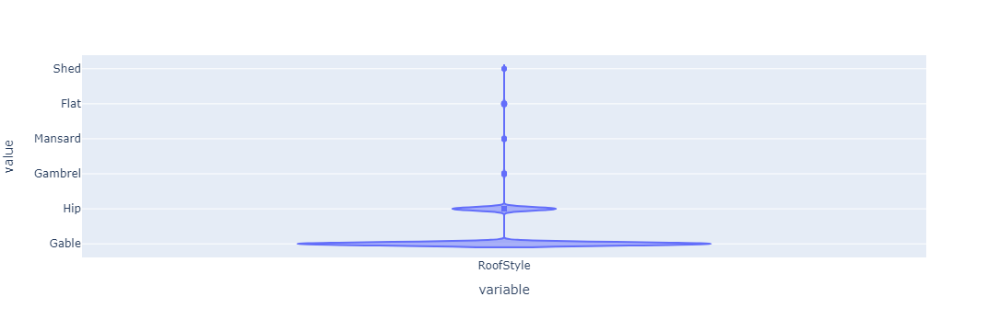

RoofMatl


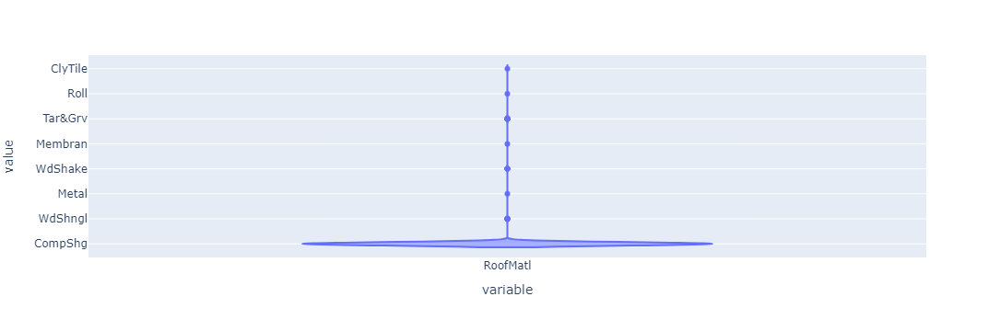

Exterior1st


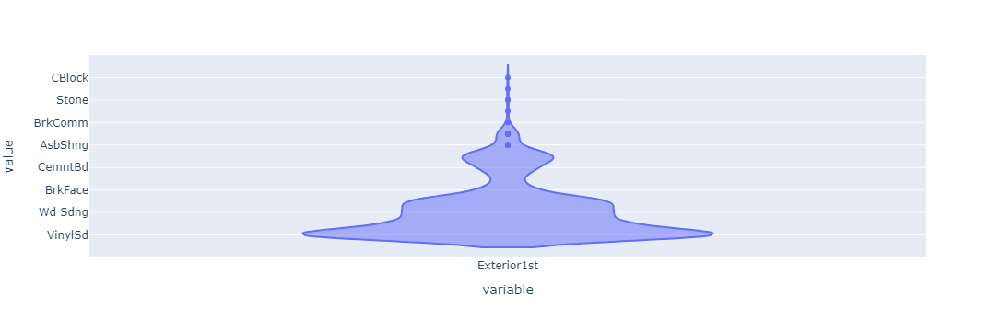

Exterior2nd


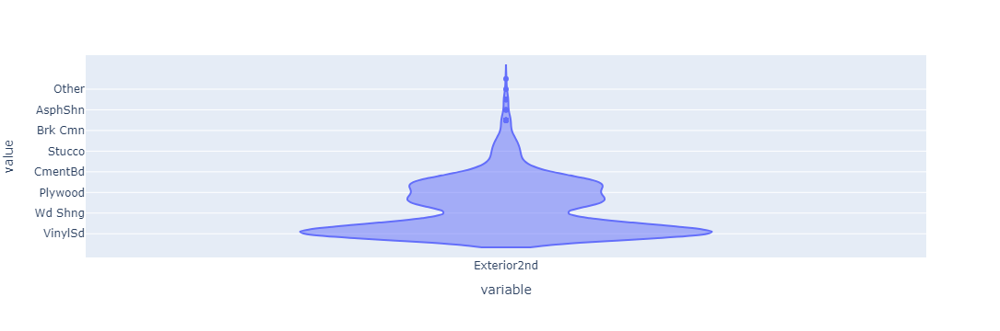

MasVnrType


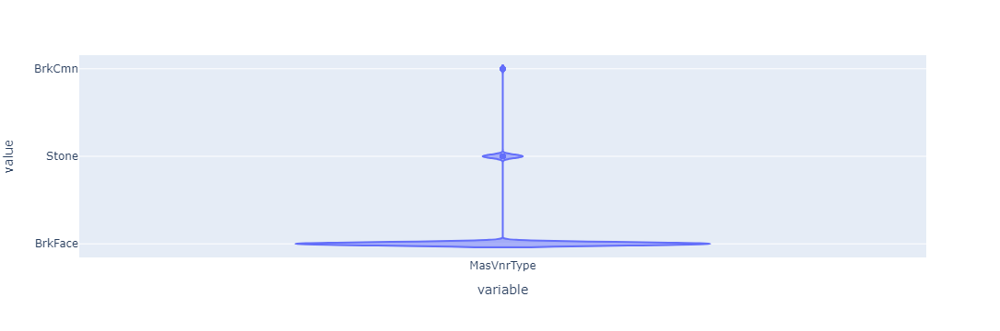

ExterQual


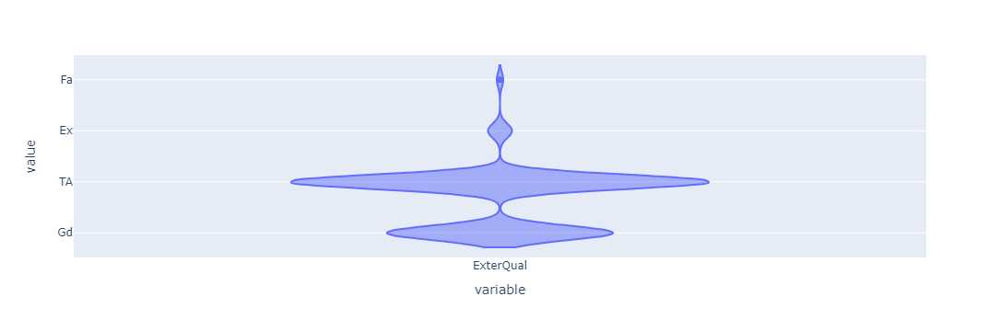

ExterCond


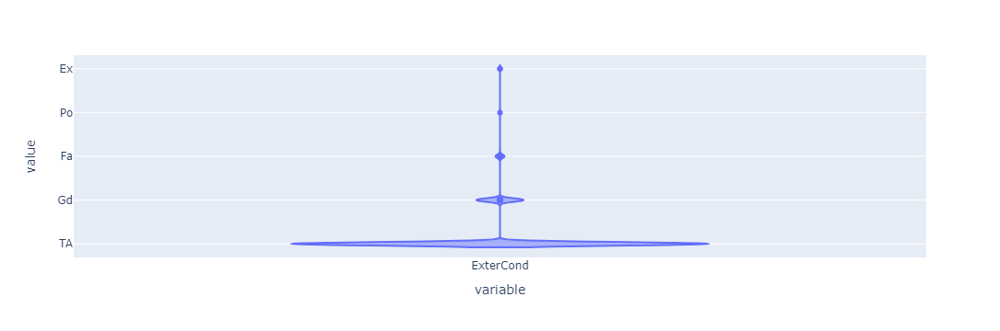

Foundation


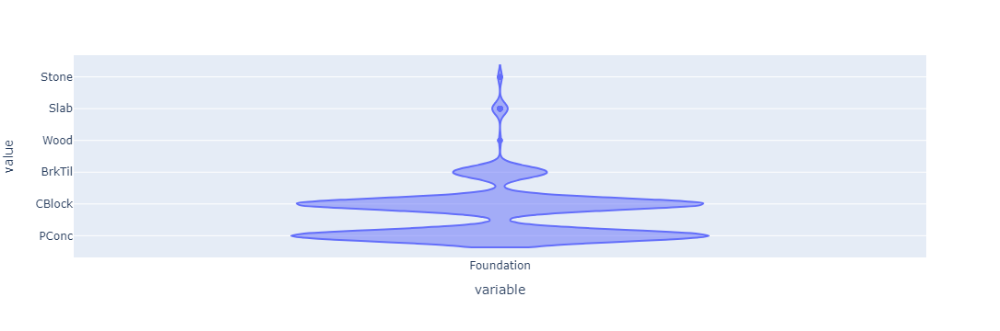

BsmtQual


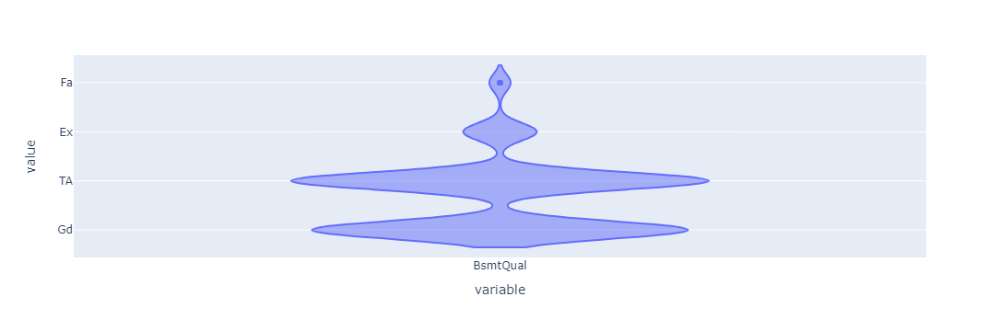

BsmtCond


BsmtExposure


BsmtFinType1


BsmtFinType2


Heating


HeatingQC


CentralAir


Electrical


KitchenQual


Functional


FireplaceQu


GarageType


GarageFinish


GarageQual


GarageCond


PavedDrive


PoolQC


Fence


MiscFeature


SaleType


SaleCondition


In [27]:
for i in cat_columns:
    fig1=px.violin(data[i])
    print(i)
    fig1.show()

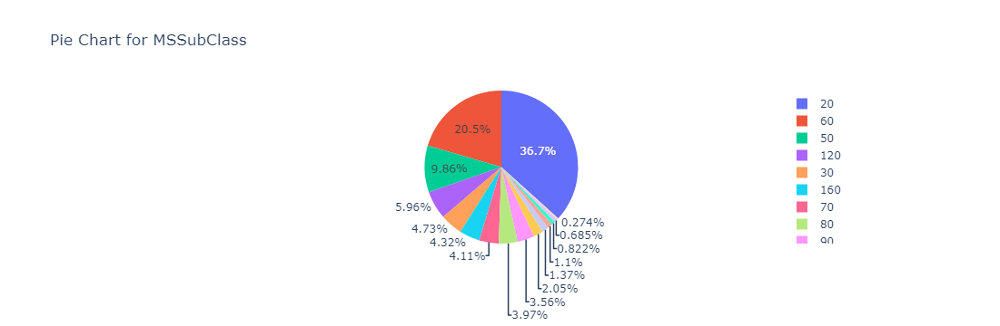

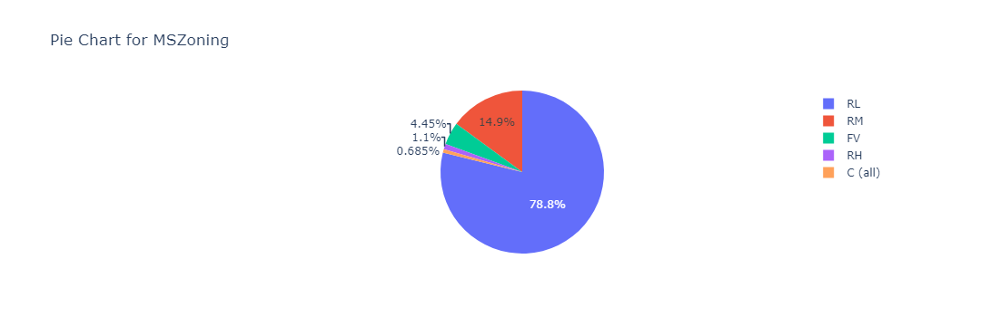

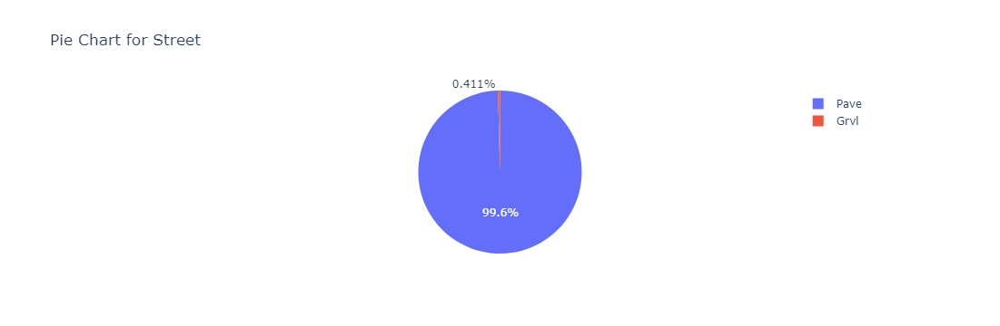

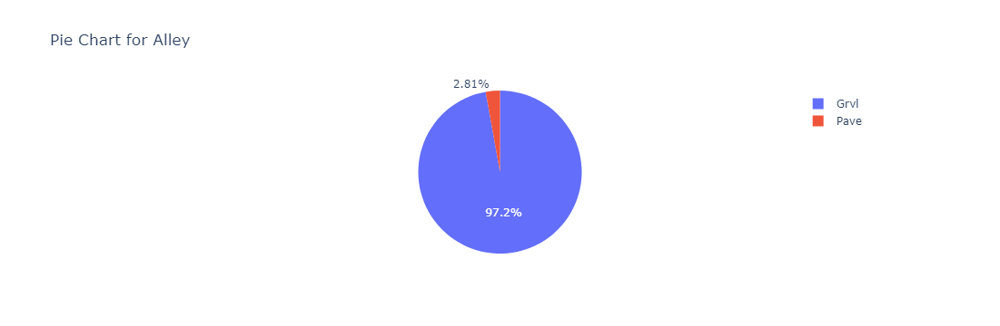

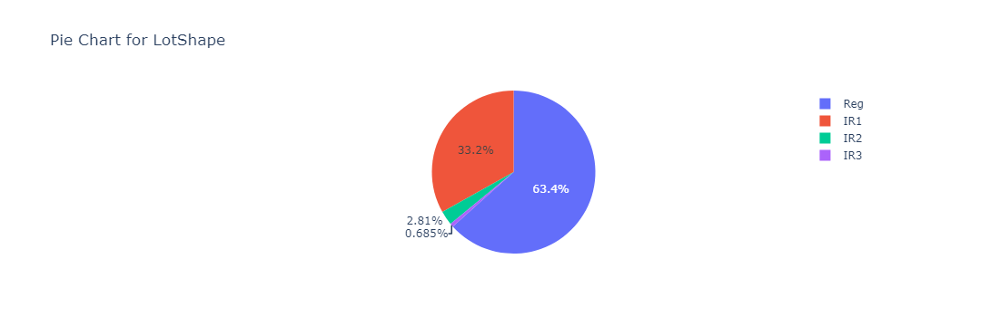

...

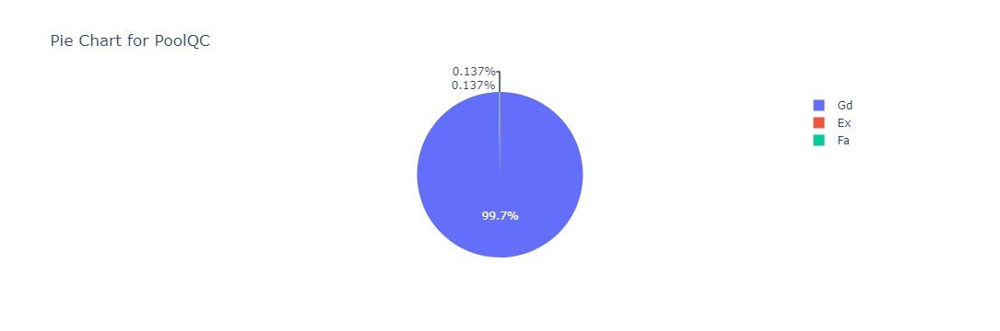

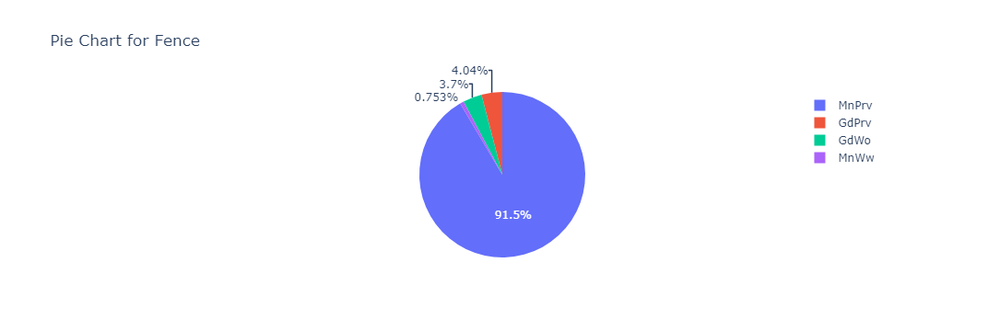

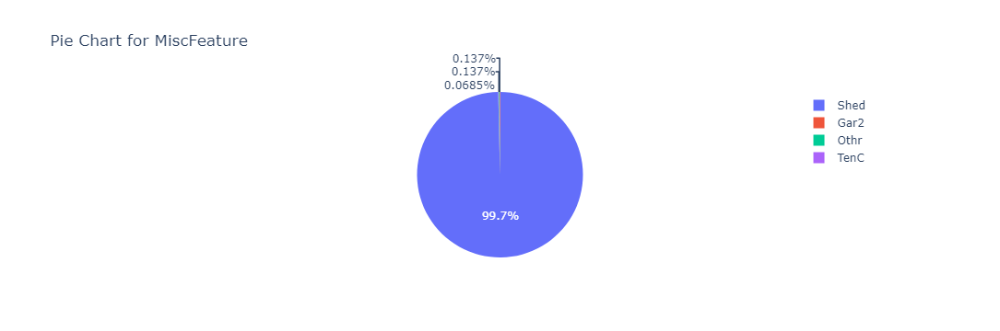

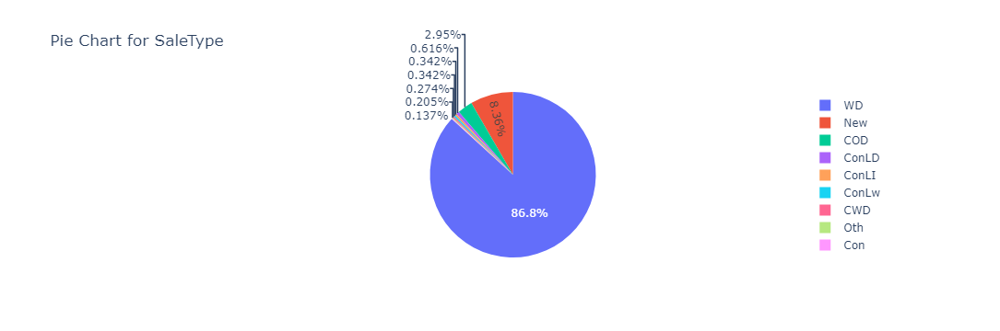

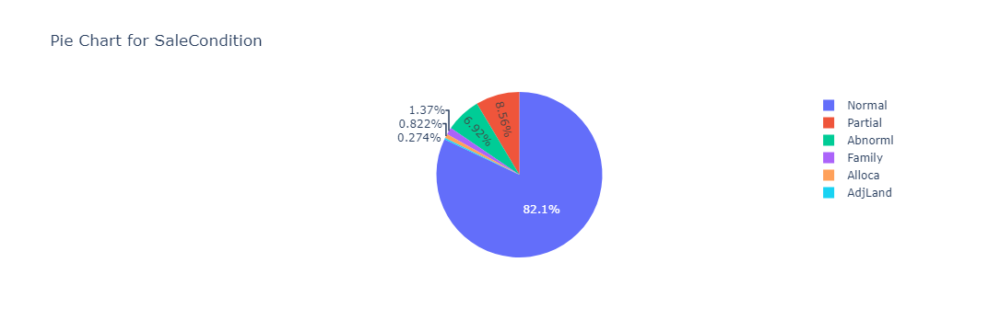

In [28]:
# Iterate over categorical columns
for i in cat_columns:
    value_counts = data[i].value_counts(normalize=True)
    fig = px.pie(names=value_counts.index, values=value_counts.values,
                 title=f'Pie Chart for {i}', labels={'names': i})
    fig.show()


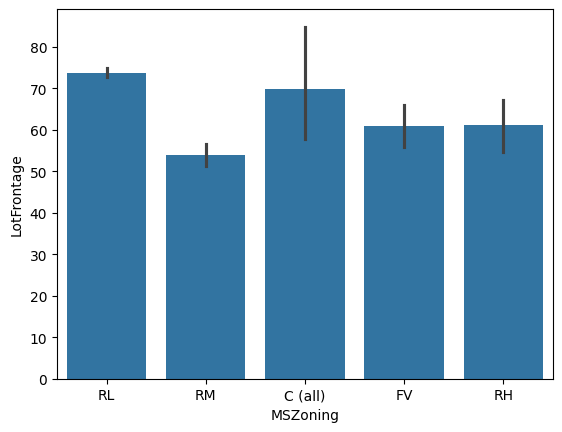

In [29]:
sns.barplot(data,x='MSZoning',y='LotFrontage')
plt.show()

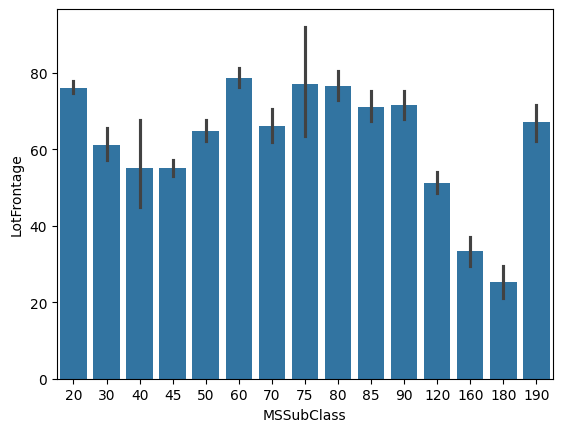

In [30]:
sns.barplot(data,x='MSSubClass',y='LotFrontage')
plt.show()

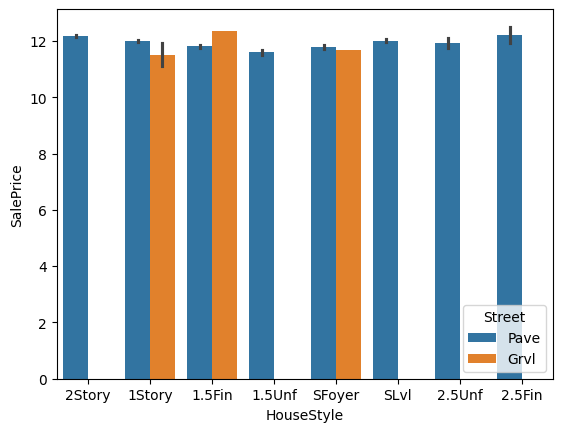

In [31]:
sns.barplot(data,x='HouseStyle',y='SalePrice',hue='Street')
plt.show()

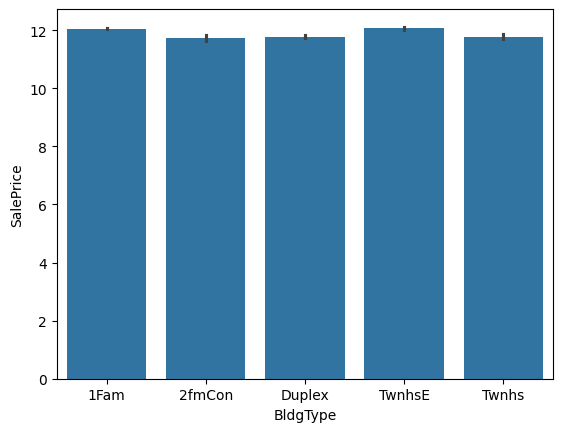

In [32]:
sns.barplot(data,x='BldgType',y='SalePrice')
plt.show()

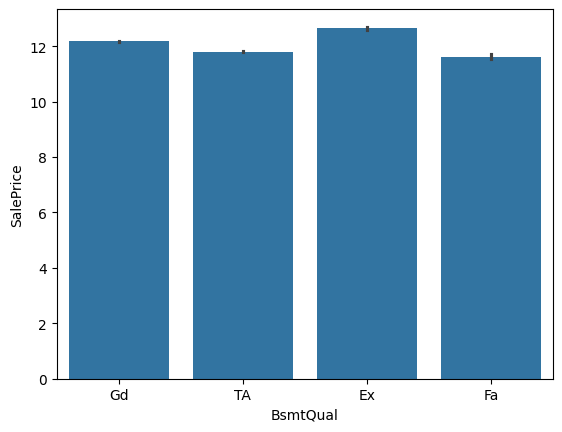

In [33]:
sns.barplot(data,x='BsmtQual',y='SalePrice')
plt.show()

In [34]:
#calculating age property
data['Age']=data['YrSold']-data['YearBuilt']
data['Age'].head()

0     5
1    31
2     7
3    91
4     8
Name: Age, dtype: int64

In [35]:
data.drop(columns=['YearBuilt','YrSold'],axis=1,inplace=True)

In [36]:
data.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,SaleType,SaleCondition,SalePrice,Age
0,60,RL,65.0,8450,Pave,Grvl,Reg,Lvl,AllPub,Inside,...,0,Gd,MnPrv,Shed,0,2,WD,Normal,12.247694,5
1,20,RL,80.0,9600,Pave,Grvl,Reg,Lvl,AllPub,FR2,...,0,Gd,MnPrv,Shed,0,5,WD,Normal,12.109011,31
2,60,RL,68.0,11250,Pave,Grvl,IR1,Lvl,AllPub,Inside,...,0,Gd,MnPrv,Shed,0,9,WD,Normal,12.317167,7
3,70,RL,60.0,9550,Pave,Grvl,IR1,Lvl,AllPub,Corner,...,0,Gd,MnPrv,Shed,0,2,WD,Abnorml,11.849398,91
4,60,RL,84.0,14260,Pave,Grvl,IR1,Lvl,AllPub,FR2,...,0,Gd,MnPrv,Shed,0,12,WD,Normal,12.429216,8


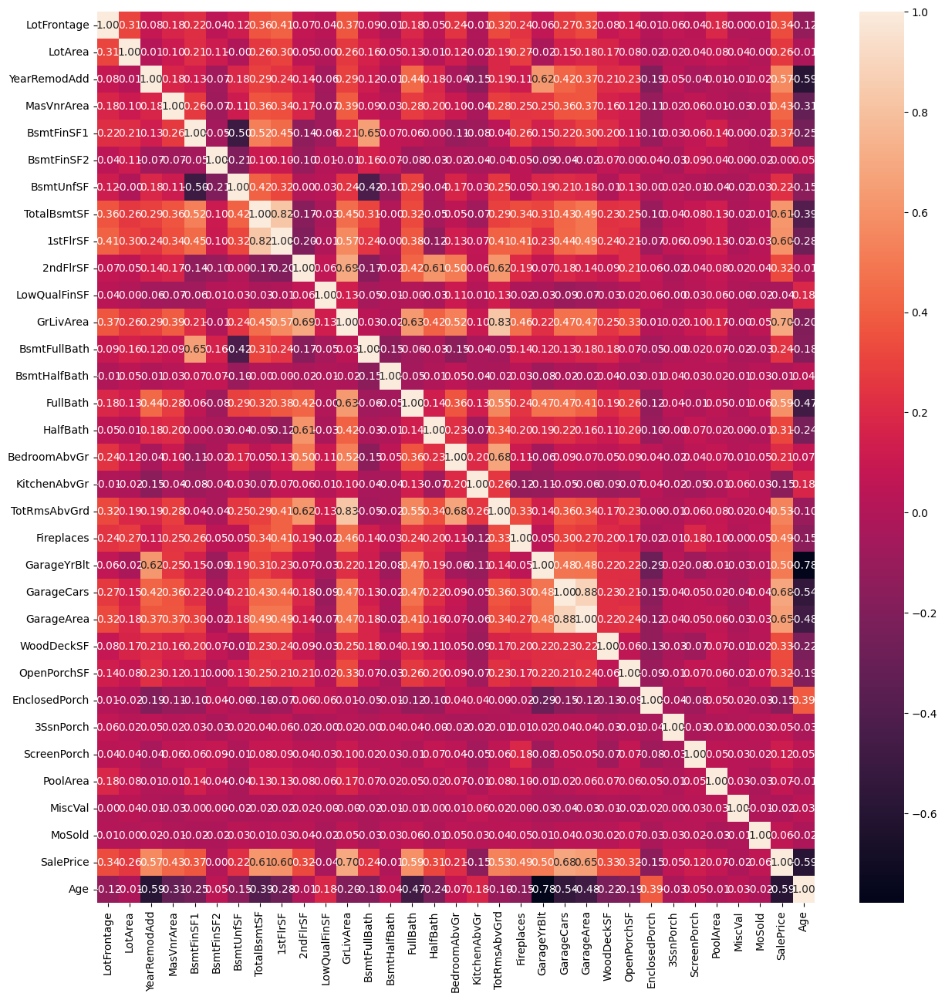

In [37]:
# Select only numerical columns
numerical_data = data.select_dtypes(include='number')

# Calculate correlation matrix
correlation = numerical_data.corr()
plt.figure(figsize=[15,15])
sns.heatmap(correlation,annot=True,cbar=True,fmt='.2f')
plt.show()

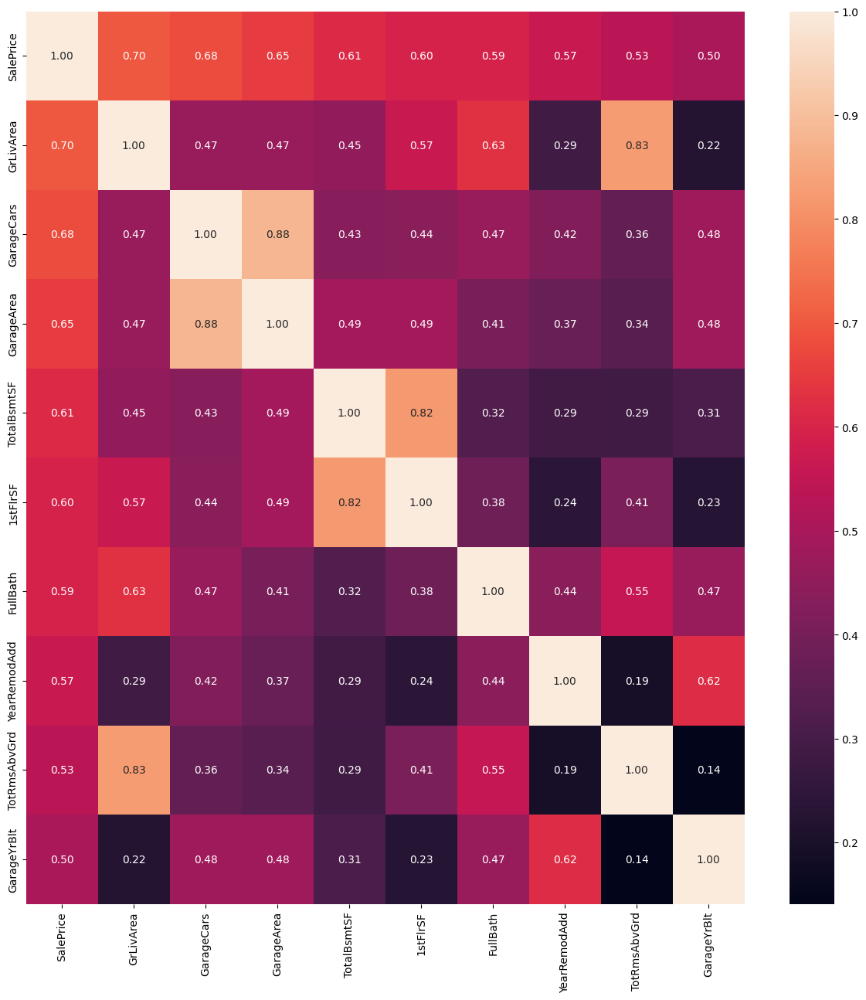

In [38]:
#get top 10 only
n=10
plt.figure(figsize=[15,15])
cols=correlation.nlargest(n,'SalePrice').index
cm=np.corrcoef(data[cols].values.T)
sns.heatmap(cm,annot=True,fmt='.2f',cbar=True,annot_kws={'size':10},
           yticklabels=cols.values,
           xticklabels=cols.values)
plt.show()

<Figure size 2000x2000 with 0 Axes>

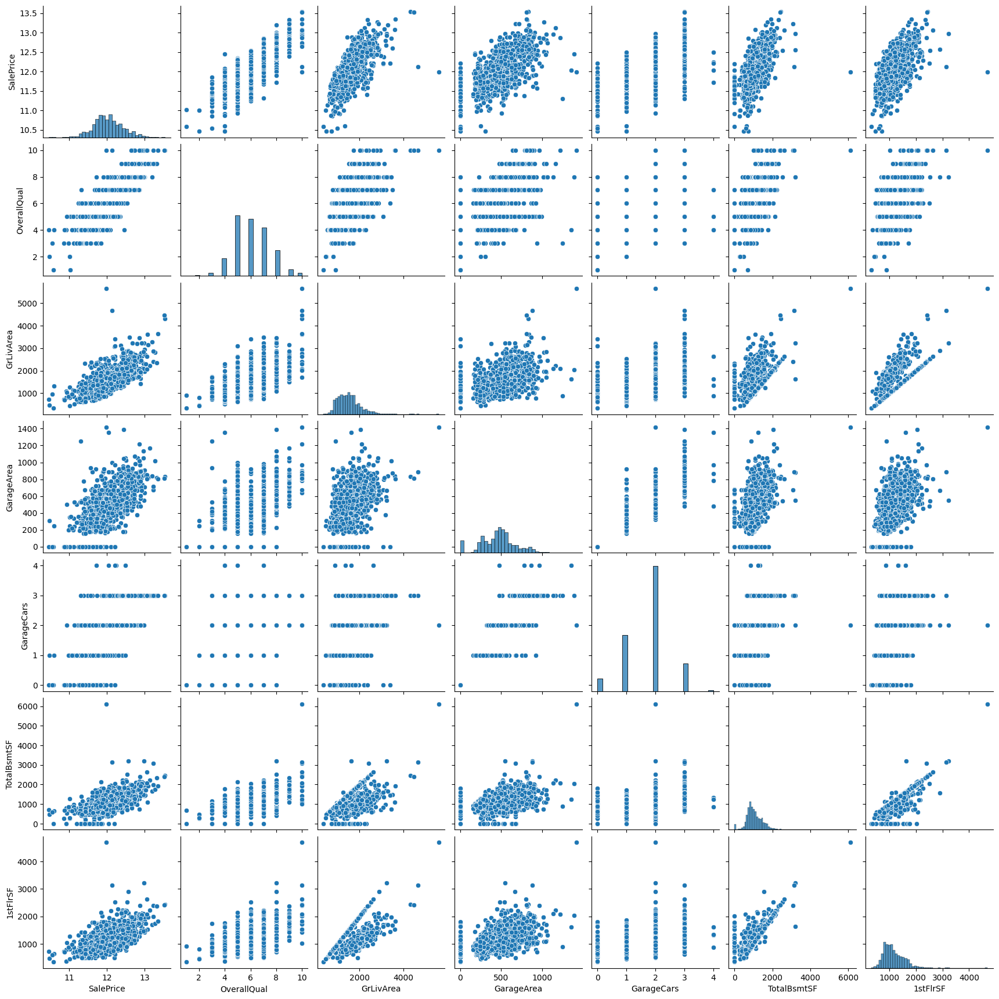

In [39]:
cols=['SalePrice','OverallQual','GrLivArea','GarageArea','GarageCars','TotalBsmtSF','1stFlrSF']
plt.figure(figsize=[20,20])
sns.pairplot(data[cols])
plt.show()

# Data preparation

In [40]:
data_num=data.select_dtypes(include=['int64','float64'])
data_cat=data.select_dtypes(include=['object'])

In [41]:
data_num_dm=pd.get_dummies(data_num,drop_first=True,dtype='int')
data_cat_dm=pd.get_dummies(data_cat,drop_first=True,dtype='int')

In [42]:
house=pd.concat([data_num,data_cat_dm],axis=1)

In [43]:
x=house.drop(['SalePrice'],axis=1)
y=house['SalePrice']

In [44]:
x.shape

(1460, 271)

In [45]:
y.shape

(1460,)

In [46]:
x_train,x_test,y_train,y_test=train_test_split(x,y, test_size=0.3, random_state=42)

In [47]:
x_train.shape

(1022, 271)

In [48]:
st=StandardScaler()
x_train=st.fit_transform(x_train)
x_test=st.fit_transform(x_test)

In [49]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge, Lasso
from sklearn.model_selection import GridSearchCV

In [50]:
#applying ridge regressing with varying parameters
params={'alpha':
       [0.0001,0.001,0.01,0.05,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,
       0.9,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10,20,50,100,500,1000]}
ridge=Ridge()
ridgeCV=GridSearchCV(estimator=ridge,param_grid=params,scoring='neg_mean_absolute_error',
                    cv=5,verbose=1,n_jobs=-1)
ridgeCV.fit(x_train,y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(), n_jobs=-1,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10, 20, 50,
                                   100, 500, 1000]},
             scoring='neg_mean_absolute_error', verbose=1)

In [51]:
ridgeCV.best_params_

{'alpha': 500}

In [52]:
ridgeCV.cv_results_

{'mean_fit_time': array([0.03898554, 0.0244082 , 0.02002907, 0.01907248, 0.02152915,
        0.02108369, 0.0237083 , 0.02827191, 0.02746143, 0.02377858,
        0.02353754, 0.02351809, 0.02389536, 0.0232162 , 0.02851367,
        0.02901096, 0.02408943, 0.02979889, 0.02734904, 0.02463331,
        0.02692308, 0.02625175, 0.02240343, 0.02555914, 0.02774673,
        0.02967014, 0.02465968, 0.02297397]),
 'std_fit_time': array([0.02623417, 0.00894854, 0.00097844, 0.00149371, 0.00236082,
        0.00091505, 0.00146937, 0.0039015 , 0.00483733, 0.00154731,
        0.00160705, 0.00220798, 0.00170204, 0.00145307, 0.0045513 ,
        0.00776406, 0.00187852, 0.00679676, 0.00329336, 0.00135963,
        0.00326092, 0.00507755, 0.00081033, 0.00088756, 0.00191681,
        0.00975669, 0.00191165, 0.00056121]),
 'mean_score_time': array([0.00432849, 0.00196238, 0.0017169 , 0.00188971, 0.00204535,
        0.00193672, 0.00198107, 0.00487909, 0.00230632, 0.00221281,
        0.00179496, 0.0020093 , 0.002112

In [53]:
ridge=Ridge(alpha=500)

In [54]:
ridge.fit(x_train,y_train)

Ridge(alpha=500)

In [55]:
y_train_pred=ridge.predict(x_train)
y_pred=ridge.predict(x_test)

In [56]:
y_test

892     11.947949
1105    12.691580
413     11.652687
522     11.976659
1036    12.661914
          ...    
331     11.842229
323     11.745425
650     12.235389
439     11.608236
798     13.091904
Name: SalePrice, Length: 438, dtype: float64

In [57]:
import numpy as np
from sklearn.metrics import accuracy_score
y_pred_rounded = np.round(y_pred)
y_test_rounded = np.round(y_test)
y_train_rounded=np.round(y_train)
y_train_pred_rounded=np.round(y_train_pred)
accuracy_train = accuracy_score(y_train_rounded, y_train_pred_rounded)
accuracy = accuracy_score(y_pred_rounded, y_test_rounded)

print("Accuracy for training data:", accuracy_train)

print("Accuracy for testing data:", accuracy)


Accuracy for training data: 0.9285714285714286
Accuracy for testing data: 0.9406392694063926


In [58]:
y_train_pred

array([12.06215933, 11.79084238, 12.27439759, ..., 11.70420722,
       12.03767847, 12.22008305])

In [59]:
from sklearn.metrics import mean_squared_error
import numpy as np

# Calculate RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred))

print("RMSE on training set:", rmse_train)
print("RMSE on test set:", rmse_test)


RMSE on training set: 0.11485440404826827
RMSE on test set: 0.1371593092572195


In [60]:
ridgeCV_res=pd.DataFrame(ridgeCV.cv_results_)
ridgeCV_res.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.038986,0.026234,0.004328,0.003188,0.0001,{'alpha': 0.0001},-0.087837,-0.121452,-0.103559,-0.091512,-0.109402,-0.102752,0.012193,28
1,0.024408,0.008949,0.001962,0.000529,0.001,{'alpha': 0.001},-0.087838,-0.121450,-0.103535,-0.091510,-0.109376,-0.102742,0.012189,27
2,0.020029,0.000978,0.001717,0.000609,0.01,{'alpha': 0.01},-0.087851,-0.121426,-0.103309,-0.091494,-0.109115,-0.102639,0.012151,26
3,0.019072,0.001494,0.001890,0.000460,0.05,{'alpha': 0.05},-0.087907,-0.121324,-0.102417,-0.091468,-0.108142,-0.102252,0.012004,25
4,0.021529,0.002361,0.002045,0.000910,0.1,{'alpha': 0.1},-0.087975,-0.121199,-0.101536,-0.091480,-0.107199,-0.101878,0.011859,23


In [62]:

lasso=Lasso()
lassoCV=GridSearchCV(estimator=ridge,param_grid=params,scoring='neg_mean_absolute_error',
                    cv=5,verbose=1,n_jobs=-1)
lassoCV.fit(x_train,y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(alpha=500), n_jobs=-1,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10, 20, 50,
                                   100, 500, 1000]},
             scoring='neg_mean_absolute_error', verbose=1)

In [63]:
lassoCV.best_params_

{'alpha': 500}

In [64]:
lasso=Lasso(alpha=0.001)
lasso.fit(x_train,y_train)

Lasso(alpha=0.001)

In [65]:
y_train_pred1=lasso.predict(x_train)
y_pred1=lasso.predict(x_test)

In [66]:
y_pred1

array([11.89759036, 12.76320148, 11.48852638, 12.04705249, 12.71636065,
       11.36416401, 12.44409118, 11.87922138, 11.32417069, 11.87431182,
       11.88145885, 11.69883212, 11.50439384, 12.29555757, 12.09078968,
       11.82446552, 12.17476006, 11.80269782, 11.55012141, 12.26852753,
       12.08829113, 12.24142299, 12.11641804, 11.83216635, 12.20843869,
       11.95308767, 12.19593113, 11.66384073, 12.10708723, 12.2152712 ,
       11.77230777, 12.55767342, 12.32419665, 11.68226207, 12.51315798,
       11.91278338, 11.88999918, 12.224872  , 12.71929892, 11.59581853,
       11.80976326, 12.37212438, 11.67672001, 12.76834249, 11.81057295,
       11.79802495, 11.6355221 , 11.81614033, 12.98523678, 11.7567965 ,
       11.70502606, 12.26241313, 11.54127866, 12.25149266, 12.06850803,
       12.3441053 , 12.26470217, 11.97757767, 11.80456296, 11.59319926,
       11.26396355, 12.05734776, 12.66832947, 12.44126982, 12.66221567,
       12.15616689, 11.59510885, 12.74034842, 11.80819689, 12.04

In [67]:
y_test

892     11.947949
1105    12.691580
413     11.652687
522     11.976659
1036    12.661914
          ...    
331     11.842229
323     11.745425
650     12.235389
439     11.608236
798     13.091904
Name: SalePrice, Length: 438, dtype: float64

In [68]:
import numpy as np
from sklearn.metrics import accuracy_score
y_pred_rounded = np.round(y_pred1)
y_test_rounded = np.round(y_test)
y_train_rounded=np.round(y_train)
y_train_pred_rounded=np.round(y_train_pred1)
accuracy_train = accuracy_score(y_train_rounded, y_train_pred_rounded)
accuracy = accuracy_score(y_pred_rounded, y_test_rounded)

print("Accuracy for training data:", accuracy_train)

print("Accuracy for testing data:", accuracy)


Accuracy for training data: 0.9334637964774951
Accuracy for testing data: 0.9315068493150684


In [69]:
from sklearn.metrics import mean_squared_error
import numpy as np

# Calculate RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred1))
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred1))

print("RMSE on training set:", rmse_train)
print("RMSE on test set:", rmse_test)


RMSE on training set: 0.09479740442807927
RMSE on test set: 0.16227608426964693


In [70]:
lassoCV_res=pd.DataFrame(lassoCV.cv_results_)
lassoCV_res.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.026104,0.002622,0.003201,0.000403,0.0001,{'alpha': 0.0001},-0.087837,-0.121452,-0.103559,-0.091512,-0.109402,-0.102752,0.012193,28
1,0.027981,0.002727,0.003011,0.001091,0.001,{'alpha': 0.001},-0.087838,-0.121450,-0.103535,-0.091510,-0.109376,-0.102742,0.012189,27
2,0.029844,0.003129,0.002443,0.000515,0.01,{'alpha': 0.01},-0.087851,-0.121426,-0.103309,-0.091494,-0.109115,-0.102639,0.012151,26
3,0.025973,0.001439,0.002625,0.000187,0.05,{'alpha': 0.05},-0.087907,-0.121324,-0.102417,-0.091468,-0.108142,-0.102252,0.012004,25
4,0.028509,0.004268,0.002819,0.000404,0.1,{'alpha': 0.1},-0.087975,-0.121199,-0.101536,-0.091480,-0.107199,-0.101878,0.011859,23


# Feature Extraction

In [71]:

betas=pd.DataFrame(index=x.columns)
betas.rows=x.columns
betas['ridge']=ridge.coef_
betas['lasso']=lasso.coef_
betas

C:\Users\karth\AppData\Local\Temp\ipykernel_13864\3404179396.py:2: UserWarning:

Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access



,ridge,lasso
LotFrontage,0.001714,0.001365
LotArea,0.011206,0.013260
YearRemodAdd,0.017312,0.019180
MasVnrArea,0.009479,0.004535
BsmtFinSF1,0.008295,0.004773
...,...,...
SaleCondition_AdjLand,0.000693,0.003982
SaleCondition_Alloca,0.010366,0.012327
SaleCondition_Family,-0.002396,0.000083
SaleCondition_Normal,0.008498,0.017877


In [72]:
lasso_cols_removed=list(betas[betas['lasso']==0].index)
lasso_cols_removed

['BsmtUnfSF',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'BsmtHalfBath',
 'OpenPorchSF',
 'MiscVal',
 'MSSubClass_45',
 'MSSubClass_50',
 'MSSubClass_75',
 'MSSubClass_85',
 'MSSubClass_120',
 'MSSubClass_190',
 'MSZoning_RH',
 'MSZoning_RM',
 'LotShape_IR3',
 'LotShape_Reg',
 'LandContour_Low',
 'LandSlope_Sev',
 'Neighborhood_BrDale',
 'Neighborhood_CollgCr',
 'Neighborhood_Gilbert',
 'Neighborhood_Sawyer',
 'Neighborhood_SawyerW',
 'Condition2_Norm',
 'Condition2_PosA',
 'Condition2_RRAe',
 'Condition2_RRAn',
 'Condition2_RRNn',
 'BldgType_2fmCon',
 'HouseStyle_2.5Fin',
 'HouseStyle_SLvl',
 'OverallQual_6',
 'OverallCond_6',
 'RoofStyle_Hip',
 'RoofMatl_Membran',
 'Exterior1st_AsphShn',
 'Exterior1st_CemntBd',
 'Exterior1st_HdBoard',
 'Exterior1st_ImStucc',
 'Exterior1st_Plywood',
 'Exterior1st_VinylSd',
 'Exterior2nd_Brk Cmn',
 'Exterior2nd_CBlock',
 'Exterior2nd_HdBoard',
 'Exterior2nd_MetalSd',
 'Exterior2nd_Stucco',
 'Exterior2nd_VinylSd',
 'Exterior2nd_Wd Shng',
 'MasVnrType_B

In [73]:
print(len(lasso_cols_removed))

76


# Top 10 features for extraction

In [74]:
betas['ridge'].sort_values(ascending=False)[:10]

GrLivArea               0.028969
GarageCars              0.028445
OverallQual_9           0.024324
TotRmsAbvGrd            0.023491
1stFlrSF                0.022722
Fireplaces              0.022114
GarageArea              0.021684
OverallQual_8           0.020392
FullBath                0.019116
Neighborhood_NridgHt    0.018944
Name: ridge, dtype: float64

In [75]:
#ridge coefficients in target variable
ridge_coeffs=np.exp(betas['ridge'])
ridge_coeffs.sort_values(ascending=False)[:10]

GrLivArea               1.029392
GarageCars              1.028854
OverallQual_9           1.024622
TotRmsAbvGrd            1.023769
1stFlrSF                1.022982
Fireplaces              1.022360
GarageArea              1.021921
OverallQual_8           1.020601
FullBath                1.019300
Neighborhood_NridgHt    1.019125
Name: ridge, dtype: float64

In [76]:
betas['lasso'].sort_values(ascending=False)[:10]

RoofMatl_CompShg    0.201670
RoofMatl_Tar&Grv    0.145975
RoofMatl_WdShngl    0.099037
GrLivArea           0.098239
RoofMatl_WdShake    0.079546
RoofMatl_Metal      0.047332
RoofMatl_Roll       0.047204
OverallQual_8       0.031359
OverallQual_9       0.030535
GarageCars          0.029071
Name: lasso, dtype: float64

In [77]:
#lasso coefficients in target variable
lasso_coeffs=np.exp(betas['lasso'])
lasso_coeffs.sort_values(ascending=False)[:10]

RoofMatl_CompShg    1.223445
RoofMatl_Tar&Grv    1.157168
RoofMatl_WdShngl    1.104108
GrLivArea           1.103226
RoofMatl_WdShake    1.082795
RoofMatl_Metal      1.048470
RoofMatl_Roll       1.048336
OverallQual_8       1.031855
OverallQual_9       1.031006
GarageCars          1.029498
Name: lasso, dtype: float64